In [1]:
from torchvision.models import inception_v3, Inception_V3_Weights
import torch.nn.functional as F
import numpy as np
from scipy import linalg
import torch.nn as nn
import zipfile
from PIL import Image
import io
import os
import torch
from torch.utils.data import Dataset
from torchvision import transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

Гиперпараметры

In [2]:
latent_dim = 100
channels = 3
image_size = 128
img_dim = channels * image_size * image_size
batch_size = 20
num_epochs = 300

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

Модель для FID

In [3]:
class InceptionFeatureExtractor(nn.Module):
    def __init__(self, device):
        super().__init__()

        weights = Inception_V3_Weights.DEFAULT
        self.inception = inception_v3(weights=weights)
        self.inception.fc = nn.Identity()
        self.inception.eval()
        self.inception.to(device)

    @torch.no_grad()
    def forward(self, x):
        x = (x + 1) / 2

        x = F.interpolate(
            x, size=(299, 299),
            mode="bilinear",
            align_corners=False
        )

        out = self.inception(x)

        if isinstance(out, tuple):
            out = out[0]

        return out

In [4]:
def compute_statistics(dataloader, model, device, max_batches=50):
    features = []

    for i, imgs in enumerate(dataloader):
        if i >= max_batches:
            break

        imgs = imgs.to(device)
        feats = model(imgs)
        features.append(feats.cpu().numpy())

    features = np.concatenate(features, axis=0)
    mu = np.mean(features, axis=0)
    sigma = np.cov(features, rowvar=False)
    return mu, sigma

Генерация изображений для FID

In [5]:
def generate_fake_images(generator, n_images, latent_dim, device):
    generator.eval()
    imgs = []

    with torch.no_grad():
        for _ in range(n_images // batch_size):
            z = torch.randn(batch_size, latent_dim, device=device)
            fake = generator(z)
            fake = fake.view(-1, 3, image_size, image_size)
            imgs.append(fake)

    return torch.cat(imgs, dim=0)

Подсчёт FID

In [6]:
def calculate_fid(mu1, sigma1, mu2, sigma2):
    diff = mu1 - mu2

    covmean, _ = linalg.sqrtm(sigma1 @ sigma2, disp=False)
    if np.iscomplexobj(covmean):
        covmean = covmean.real

    fid = diff @ diff + np.trace(sigma1 + sigma2 - 2 * covmean)
    return fid

Генератор

In [7]:
generator = nn.Sequential(
    nn.Linear(latent_dim, 512),
    nn.BatchNorm1d(512),
    nn.ReLU(True),
    nn.Linear(512, 1024),
    nn.BatchNorm1d(1024),
    nn.ReLU(True),
    nn.Linear(1024, img_dim),
    nn.Tanh()
).to(device)


Дискриминатор

In [8]:
discriminator = nn.Sequential(
    nn.Linear(img_dim, 1024),
    nn.LeakyReLU(0.2, inplace=True),
    nn.Dropout(0.4),
    nn.Linear(1024, 512),
    nn.LeakyReLU(0.2, inplace=True),
    nn.Dropout(0.4),
    nn.Linear(512, 1),
    nn.Sigmoid()
).to(device)


Инициализация весов

In [22]:
discriminator = nn.Sequential(
    nn.Linear(img_dim, 1024),
    nn.LeakyReLU(0.2, inplace=True),
    nn.Dropout(0.4),
    nn.Linear(1024, 512),
    nn.LeakyReLU(0.2, inplace=True),
    nn.Dropout(0.4),
    nn.Linear(512, 1),
    nn.Sigmoid()
).to(device)


Функция потерь и оптимизаторы

In [9]:
criterion = nn.BCELoss()
optimizer_G = torch.optim.Adam(generator.parameters(), lr=2e-4, betas=(0.5, 0.999))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=1e-4, betas=(0.5, 0.999))

Обработка данных

In [10]:
class ZipImageDataset(Dataset):
    def __init__(self, zip_path, image_size):
        self.zip_file = zipfile.ZipFile(zip_path)
        self.image_names = [name for name in self.zip_file.namelist() if name.lower().endswith(('.png', '.jpg', '.jpeg'))]
        self.transform = transforms.Compose([
            transforms.Resize(image_size),
            transforms.CenterCrop(image_size),
            transforms.ToTensor(),
            transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
        ])

    def __len__(self): return len(self.image_names)
    def __getitem__(self, idx):
        with self.zip_file.open(self.image_names[idx]) as f:
            img = Image.open(io.BytesIO(f.read())).convert("RGB")
        return self.transform(img)

dataset = ZipImageDataset("data/pizza.zip", image_size=image_size)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, drop_last=True)

fixed_z = torch.randn(16, latent_dim, device=device)

Генерация изображений

In [11]:
def generate_and_show(generator, fixed_z=None, n_images=16):
    generator.eval()
    with torch.no_grad():
        z = fixed_z[:n_images] if fixed_z is not None else torch.randn(n_images, latent_dim, device=device)
        fake_imgs = generator(z)
    fake_imgs = ((fake_imgs + 1) / 2).view(n_images, 3, image_size, image_size).permute(0, 2, 3, 1).cpu()
    grid = int(n_images ** 0.5)
    fig, axes = plt.subplots(grid, grid, figsize=(8, 8))
    for i in range(grid):
        for j in range(grid):
            axes[i, j].imshow(fake_imgs[i*grid + j])
            axes[i, j].axis("off")
    plt.tight_layout()
    plt.show()
    generator.train()

Обучение

In [18]:
checkpoint_path = 'gan_checkpoint.pth'
start_epoch = 0
d_losses = []
g_losses = []
fid_history = []
fixed_z = torch.randn(64, latent_dim, device=device)

inception = InceptionFeatureExtractor(device)

real_mu, real_sigma = compute_statistics(
    dataloader, inception, device
)

if os.path.exists(checkpoint_path):
    checkpoint = torch.load(checkpoint_path, map_location=device, weights_only=False)
    generator.load_state_dict(checkpoint['generator_state'])
    discriminator.load_state_dict(checkpoint['discriminator_state'])
    optimizer_G.load_state_dict(checkpoint['optimizer_G_state'])
    optimizer_D.load_state_dict(checkpoint['optimizer_D_state'])
    start_epoch = checkpoint['epoch']
    d_losses = checkpoint['d_losses']
    g_losses = checkpoint['g_losses']
    fid_history = checkpoint.get("fid_history", [])
    fixed_z = checkpoint['fixed_z']
    print(f"Загружен чекпоинт с эпохи {start_epoch}")


Загружен чекпоинт с эпохи 80


[Epoch 80/300] [Batch 0] D: 0.5474 G: 522.5294 Real mean: -0.0971 Fake mean: -0.1010
Чекпоинт сохранён: gan_checkpoint.pth


C:\Users\Владимир Савинский\AppData\Local\Temp\ipykernel_22172\844567404.py:4: DeprecationWarning: The `disp` argument is deprecated and will be removed in SciPy 1.18.0.
  covmean, _ = linalg.sqrtm(sigma1 @ sigma2, disp=False)


Epoch 80: FID = 278.10
Epoch 81 samples:


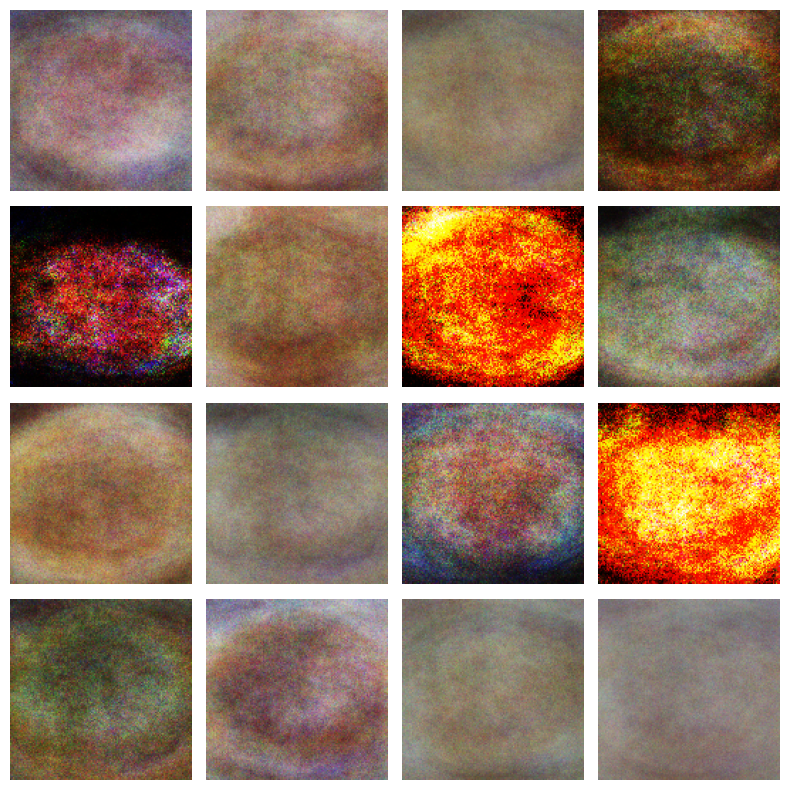

[Epoch 81/300] [Batch 0] D: 0.6222 G: 531.7734 Real mean: -0.1523 Fake mean: -0.0971
[Epoch 82/300] [Batch 0] D: 0.5810 G: 645.9664 Real mean: -0.1219 Fake mean: -0.1538
[Epoch 83/300] [Batch 0] D: 0.5560 G: 694.8475 Real mean: -0.1502 Fake mean: -0.1510
[Epoch 84/300] [Batch 0] D: 0.5381 G: 429.5201 Real mean: -0.1585 Fake mean: -0.1413
[Epoch 85/300] [Batch 0] D: 0.5334 G: 624.6650 Real mean: -0.0943 Fake mean: -0.1456
[Epoch 86/300] [Batch 0] D: 0.5668 G: 593.2015 Real mean: -0.1377 Fake mean: -0.1785
[Epoch 87/300] [Batch 0] D: 0.5785 G: 729.3222 Real mean: -0.0818 Fake mean: -0.2069
[Epoch 88/300] [Batch 0] D: 0.6218 G: 637.1404 Real mean: -0.1830 Fake mean: -0.1673
[Epoch 89/300] [Batch 0] D: 0.5756 G: 614.5490 Real mean: -0.1569 Fake mean: -0.1621
[Epoch 90/300] [Batch 0] D: 0.6315 G: 609.8934 Real mean: -0.1337 Fake mean: -0.1399
Чекпоинт сохранён: gan_checkpoint.pth
Epoch 90: FID = 285.07
[Epoch 91/300] [Batch 0] D: 0.6866 G: 572.4235 Real mean: -0.1190 Fake mean: -0.1303
[Epo

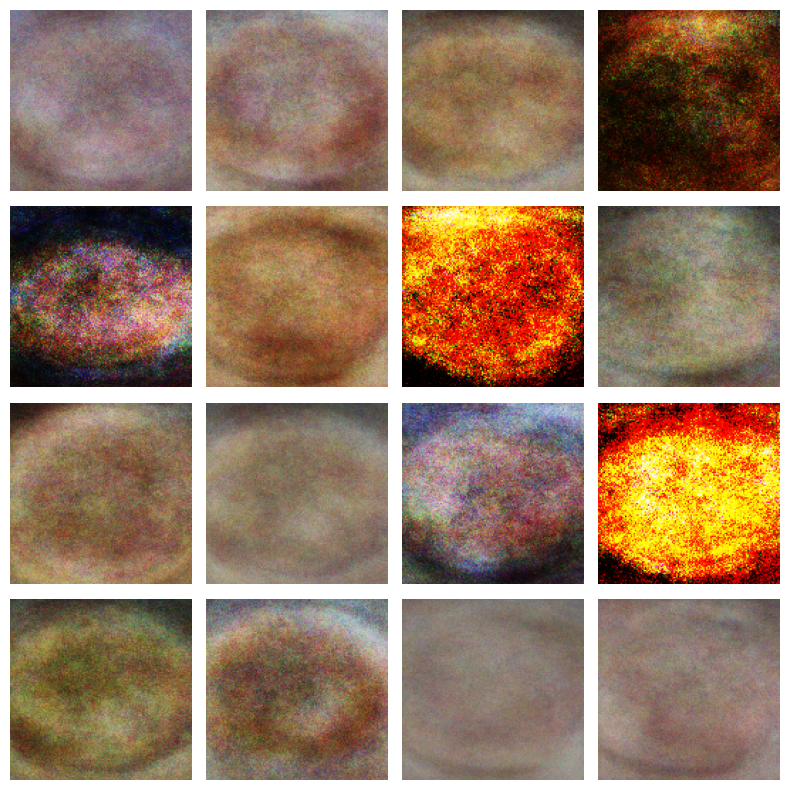

[Epoch 101/300] [Batch 0] D: 0.5542 G: 688.9302 Real mean: -0.2310 Fake mean: -0.1571
[Epoch 102/300] [Batch 0] D: 0.5738 G: 691.2710 Real mean: -0.1120 Fake mean: -0.1240
[Epoch 103/300] [Batch 0] D: 0.5797 G: 589.7288 Real mean: -0.1741 Fake mean: -0.1326
[Epoch 104/300] [Batch 0] D: 0.5796 G: 759.6122 Real mean: -0.1516 Fake mean: -0.1205
[Epoch 105/300] [Batch 0] D: 0.5533 G: 800.9813 Real mean: -0.1546 Fake mean: -0.1381
[Epoch 106/300] [Batch 0] D: 0.6012 G: 772.3740 Real mean: -0.1798 Fake mean: -0.1580
[Epoch 107/300] [Batch 0] D: 0.5525 G: 845.8250 Real mean: -0.1227 Fake mean: -0.1386
[Epoch 108/300] [Batch 0] D: 0.5544 G: 874.1558 Real mean: -0.1185 Fake mean: -0.2070
[Epoch 109/300] [Batch 0] D: 0.5870 G: 621.5974 Real mean: -0.1746 Fake mean: -0.1526
[Epoch 110/300] [Batch 0] D: 0.5818 G: 750.1906 Real mean: -0.1612 Fake mean: -0.1563
Чекпоинт сохранён: gan_checkpoint.pth
Epoch 110: FID = 248.92
[Epoch 111/300] [Batch 0] D: 0.6291 G: 891.0717 Real mean: -0.1514 Fake mean: 

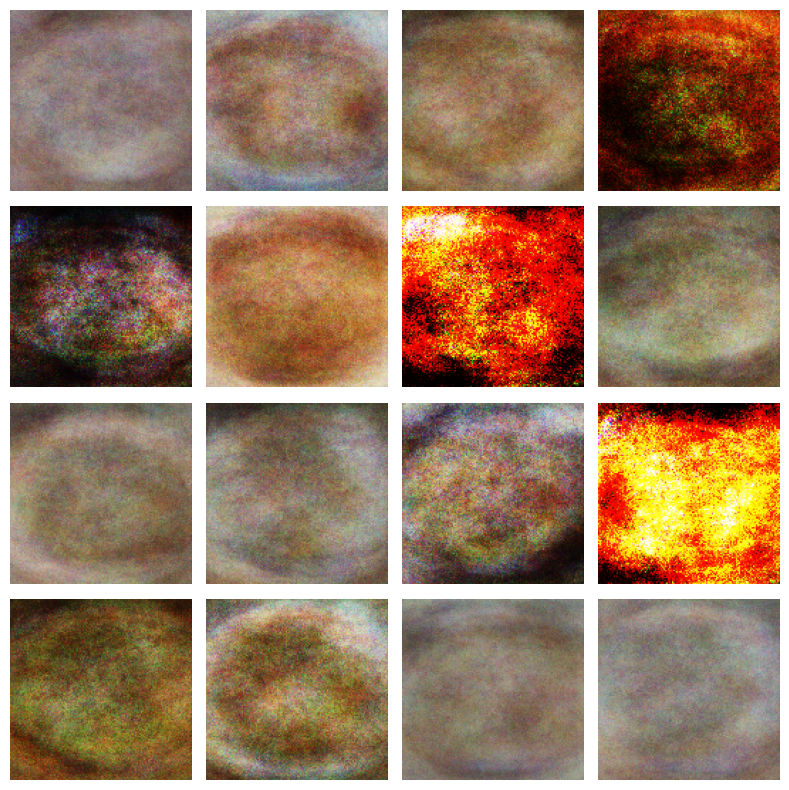

[Epoch 121/300] [Batch 0] D: 0.5498 G: 884.8588 Real mean: -0.0848 Fake mean: -0.1836
[Epoch 122/300] [Batch 0] D: 0.5484 G: 885.7921 Real mean: -0.1580 Fake mean: -0.1619
[Epoch 123/300] [Batch 0] D: 0.5563 G: 772.5619 Real mean: -0.1136 Fake mean: -0.1878
[Epoch 124/300] [Batch 0] D: 0.5267 G: 712.4796 Real mean: -0.1655 Fake mean: -0.1631
[Epoch 125/300] [Batch 0] D: 0.5498 G: 881.7479 Real mean: -0.0641 Fake mean: -0.1469
[Epoch 126/300] [Batch 0] D: 0.6379 G: 728.8054 Real mean: -0.2129 Fake mean: -0.1699
[Epoch 127/300] [Batch 0] D: 0.6343 G: 834.7097 Real mean: -0.1573 Fake mean: -0.1689
[Epoch 128/300] [Batch 0] D: 0.6123 G: 818.2581 Real mean: -0.2065 Fake mean: -0.1629
[Epoch 129/300] [Batch 0] D: 0.6207 G: 793.5802 Real mean: -0.1451 Fake mean: -0.1778
[Epoch 130/300] [Batch 0] D: 0.6488 G: 885.3707 Real mean: -0.1308 Fake mean: -0.1618
Чекпоинт сохранён: gan_checkpoint.pth
Epoch 130: FID = 251.47
[Epoch 131/300] [Batch 0] D: 0.6909 G: 1102.0558 Real mean: -0.0634 Fake mean:

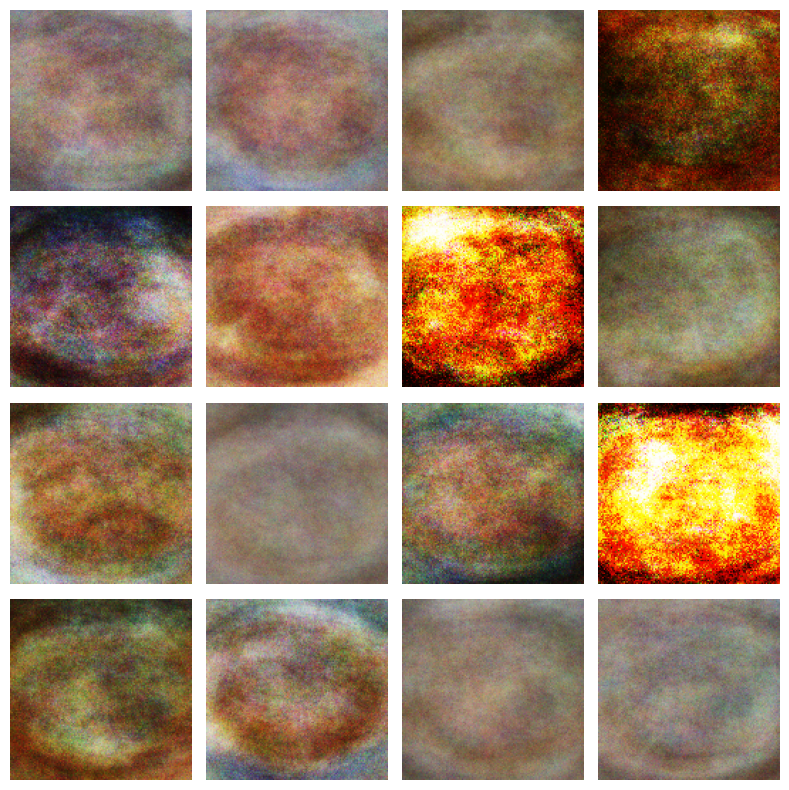

[Epoch 141/300] [Batch 0] D: 0.5836 G: 831.9780 Real mean: -0.1897 Fake mean: -0.1821
[Epoch 142/300] [Batch 0] D: 0.5603 G: 944.7925 Real mean: -0.1370 Fake mean: -0.1644
[Epoch 143/300] [Batch 0] D: 0.5232 G: 802.7586 Real mean: -0.1479 Fake mean: -0.1498
[Epoch 144/300] [Batch 0] D: 0.5616 G: 1066.2974 Real mean: -0.1205 Fake mean: -0.1166
[Epoch 145/300] [Batch 0] D: 0.6177 G: 1042.4067 Real mean: -0.1850 Fake mean: -0.1818
[Epoch 146/300] [Batch 0] D: 0.6308 G: 952.3459 Real mean: -0.0735 Fake mean: -0.1335
[Epoch 147/300] [Batch 0] D: 0.5814 G: 921.4955 Real mean: -0.1555 Fake mean: -0.1341
[Epoch 148/300] [Batch 0] D: 0.5692 G: 899.8372 Real mean: -0.1166 Fake mean: -0.1301
[Epoch 149/300] [Batch 0] D: 0.5504 G: 954.3457 Real mean: -0.1424 Fake mean: -0.1563
[Epoch 150/300] [Batch 0] D: 0.5636 G: 1105.8030 Real mean: -0.1675 Fake mean: -0.1820
Чекпоинт сохранён: gan_checkpoint.pth
Epoch 150: FID = 284.53
[Epoch 151/300] [Batch 0] D: 0.6239 G: 1184.2412 Real mean: -0.1552 Fake me

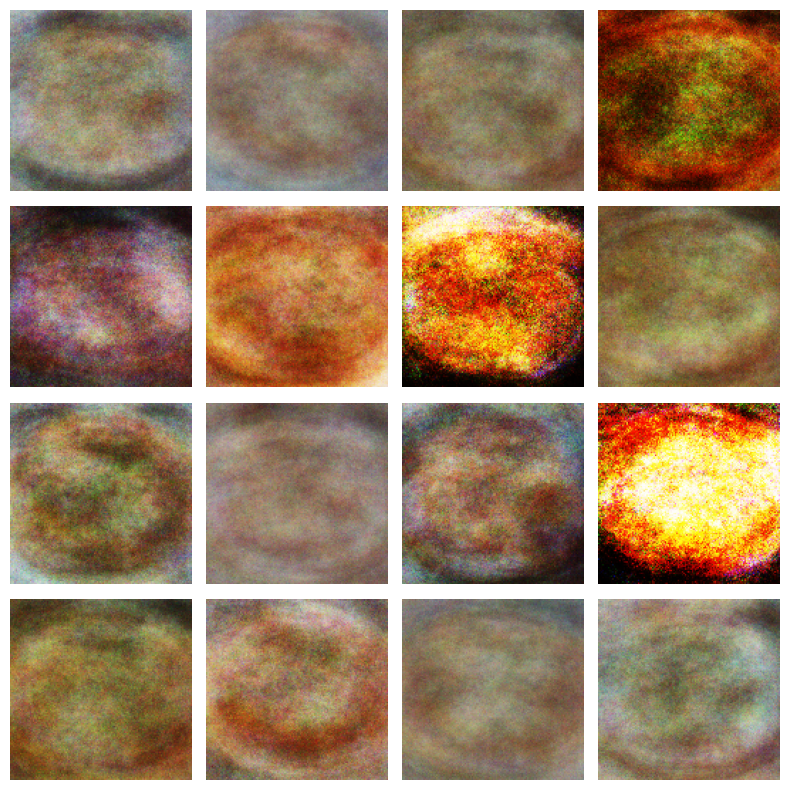

[Epoch 161/300] [Batch 0] D: 0.6433 G: 940.4880 Real mean: -0.1674 Fake mean: -0.1752


KeyboardInterrupt: 

In [19]:
for epoch in range(start_epoch, num_epochs):
    for i, real_imgs in enumerate(dataloader):
        real_imgs = real_imgs.to(device).view(batch_size, -1)
        valid = torch.full((batch_size, 1), 0.9, device=device)
        fake_label = torch.full((batch_size, 1), 0.1, device=device)

        #D
        z = torch.randn(batch_size, latent_dim, device=device)
        fake_imgs = generator(z)

        real_loss = criterion(discriminator(real_imgs), valid)
        fake_loss = criterion(discriminator(fake_imgs.detach()), fake_label)
        d_loss = (real_loss + fake_loss) / 2

        optimizer_D.zero_grad()
        d_loss.backward()
        optimizer_D.step()

        #G
        fake_imgs = generator(z)
        bce_g_loss = criterion(discriminator(fake_imgs), valid)

        feat_real = discriminator[0:3](real_imgs)
        feat_fake = discriminator[0:3](fake_imgs)
        fm_loss = F.mse_loss(feat_real, feat_fake.detach())

        g_loss = bce_g_loss + 10 * fm_loss

        optimizer_G.zero_grad()
        g_loss.backward()
        optimizer_G.step()

        d_losses.append(d_loss.item())
        g_losses.append(g_loss.item())

        if i % 200 == 0:
            print(f"[Epoch {epoch}/{num_epochs}] [Batch {i}] "
                  f"D: {d_loss:.4f} G: {g_loss:.4f} "
                  f"Real mean: {real_imgs.mean():.4f} Fake mean: {fake_imgs.mean():.4f}")

    # Сохранение чекпоинта каждые 10 эпох
    if epoch % 10 == 0:
        checkpoint = {
            'epoch': epoch + 1,
            'generator_state': generator.state_dict(),
            'discriminator_state': discriminator.state_dict(),
            'optimizer_G_state': optimizer_G.state_dict(),
            'optimizer_D_state': optimizer_D.state_dict(),
            'd_losses': d_losses,
            'g_losses': g_losses,
            "fid_history": fid_history,
            'fixed_z': fixed_z
        }
        torch.save(checkpoint, checkpoint_path)
        print(f"Чекпоинт сохранён: {checkpoint_path}")

    if epoch % 10 == 0:
        generator.eval()
    
        fake_imgs = generate_fake_images(
            generator, 1000, latent_dim, device
        )
    
        fake_mu, fake_sigma = compute_statistics(
            DataLoader(fake_imgs, batch_size=batch_size),
            inception,
            device
        )
    
        fid = calculate_fid(real_mu, real_sigma, fake_mu, fake_sigma)
        fid_history.append((epoch, fid))
    
        print(f"Epoch {epoch}: FID = {fid:.2f}")
    
        generator.train()


    if epoch % 20 == 0:
        print(f"Epoch {epoch+1} samples:")
        generate_and_show(generator, fixed_z)


Результаты обучения

Загружен gan_checkpoint.pth: generator + fixed_z + losses (epoch 161)


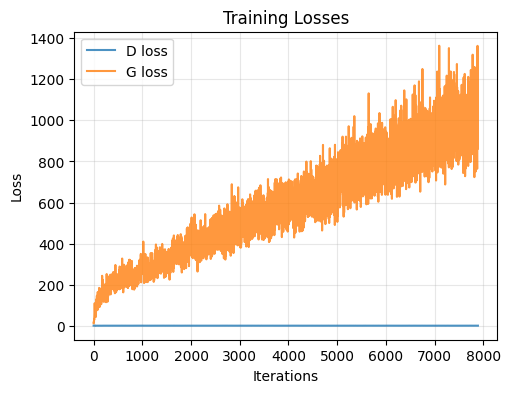

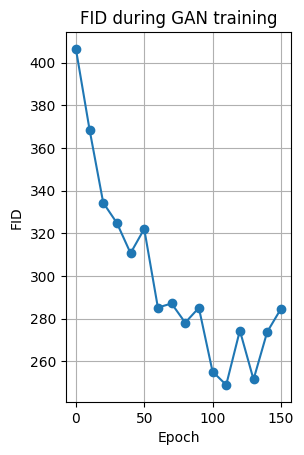

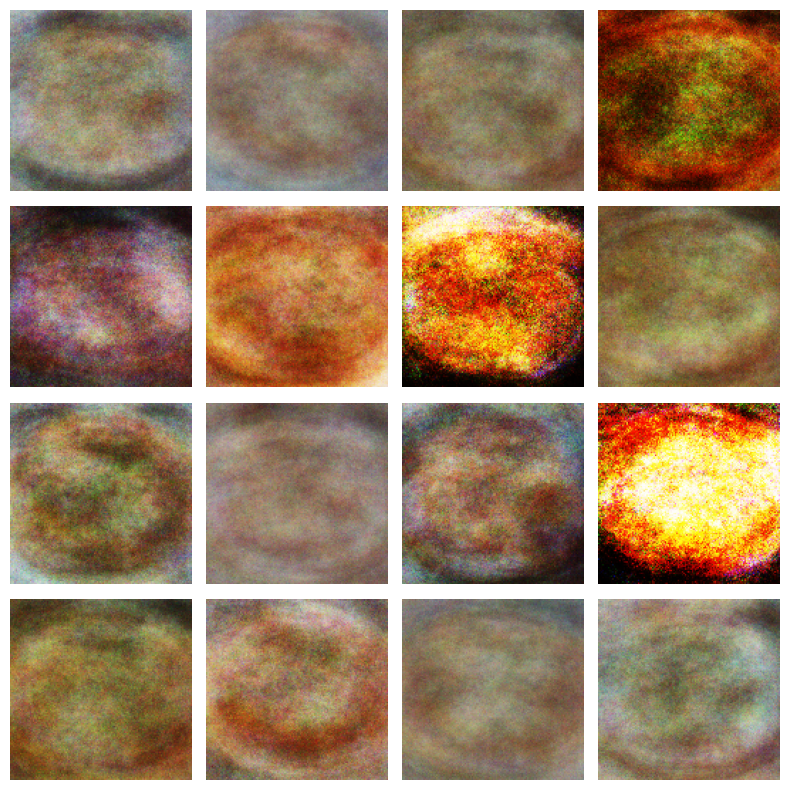

In [21]:
if os.path.exists(checkpoint_path):
    checkpoint = torch.load(checkpoint_path, map_location=device, weights_only=False)
    generator.load_state_dict(checkpoint['generator_state'])

    if 'fixed_z' in checkpoint:
        fixed_z = checkpoint['fixed_z']
    if 'd_losses' in checkpoint:
        d_losses = checkpoint['d_losses']
    if 'g_losses' in checkpoint:
        g_losses = checkpoint['g_losses']
    if 'fid_history' in checkpoint:
        fid_history = checkpoint['fid_history']

    print(f"Загружен gan_checkpoint.pth: generator + fixed_z + losses (epoch {checkpoint.get('epoch', 'N/A')})")
else:
    print("gan_checkpoint.pth не найден")

generator.eval()

if len(d_losses) > 0 and len(g_losses) > 0:
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 2, 1)
    plt.plot(d_losses, label='D loss', alpha=0.8)
    plt.plot(g_losses, label='G loss', alpha=0.8)
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.title('Training Losses')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()
    
if len(fid_history) > 0:
    epochs, fids = zip(*fid_history)
    plt.subplot(1, 2, 2)
    plt.plot(epochs, fids, marker='o')
    plt.xlabel("Epoch")
    plt.ylabel("FID")
    plt.title("FID during GAN training")
    plt.grid(True)
    plt.show()

generate_and_show(generator, fixed_z)